In [1]:
from boututils.datafile import DataFile
from boutdata.collect import collect
from boutdata.data import BoutData
import os, sys
import matplotlib
# matplotlib.use('Qt5Agg',force=True)
# matplotlib.use("TKAgg",force=True)
# matplotlib.use("widget",force=True)
import matplotlib.pyplot as plt
import xbout
import pandas as pd
import numpy as np
import pickle as pkl
import xarray as xr

from boutdata.restart import addvar
import glob
import shutil

import scipy

sys.path.append(r"/ssd_scratch/scripts/sdtools")


from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *
from hermes3.utils import *
# from code_comparison.code_comparison import *


%load_ext autoreload
%autoreload 2

In [2]:
cs = dict()

# IO

In [3]:
db = CaseDB(
    case_dir = r"/ssd_scratch/hcases",
    grid_dir = r"/ssd_scratch/hcases"
    )

toload = [
    dict(name="test5", id="not2f-test5_1e21_20eV_loc3", grid="g3b2-fatter_newhypno.nc", unnormalise_geom = True, use_xhermes = False), 
    dict(name="test-new1", id="not3b-test5-6e9e350", grid="g3b2-fatter_newhypno.nc", unnormalise_geom = True, use_xhermes = False), 
]


for case in toload:
    cs[case["name"]] = Load.case_2D(db.casepaths[case["id"]], gridfilepath = db.gridpaths[case["grid"]],
                                            unnormalise_geom = case["unnormalise_geom"])



Unnormalising with xHermes
No recycling partner found for d+

Unnormalising with xHermes
No recycling partner found for d+


In [16]:
%matplotlib inline
plt.close("all")

# Test 5
- Move location to just below X-point (loc 3)
- Puff 1e21 @ 20eV for 250t
- Continue without puff at 5t timesteps

In [13]:
%matplotlib inline
plt.close("all")
tinds = [5,7,9,11,13,-1]

## Density

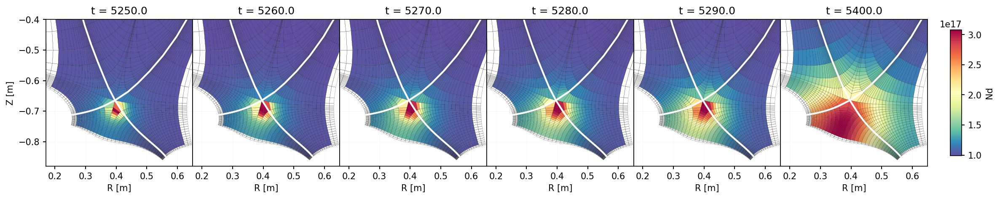

In [19]:
plot_2d_timeslices(cs["test5"].ds, "Nd", 
                   logscale = False,
                   common_scale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

# Original operator version test
- You can see bifurcation very close to the puff site around the X-point

/tmp/ipykernel_3057196/125579431.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

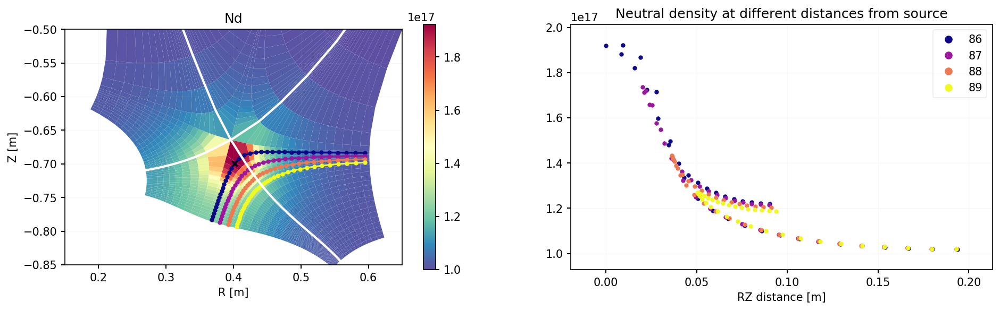

In [9]:
ds = cs["test5"].ds.isel(t=10)
m = ds.metadata

fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(86,90)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    # sl = ds.isel(theta = theta_idx, x = slice(18, -2))
    p1 = ds.isel(x = 18, theta=86)
    
    rdist = sl["R"] - p1["R"]
    zdist = sl["Z"] - p1["Z"]
    dist = np.sqrt(rdist**2 + zdist**2)
    
    # dist = np.cumsum(sl["dr"])
    # dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Nd"], marker = "o", ms = 3, label = theta_idx, color = colors[i], lw = 0)
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Nd"], marker = "o", label = theta_idx, color = colors[i])
    

axes[0].scatter(p1["R"], p1["Z"], marker = "x", c = "k", s = 25, zorder = 100)
axes[1].legend()
axes[1].set_yscale("linear")
axes[1].set_xlabel("RZ distance [m]")
# axes[1].set_ylabel("Temp [eV]")
axes[1].set_title("Neutral density at different distances from source")

ds["Nd"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

/tmp/ipykernel_3057196/3793409751.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

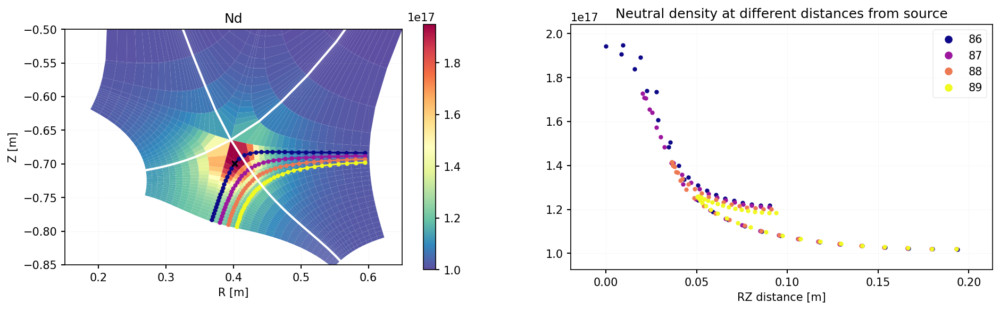

In [19]:
ds = cs["test-new1"].ds.isel(t=10)
m = ds.metadata

fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

indices = range(86,90)
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, theta_idx in enumerate(indices):
    sl = ds.isel(theta = theta_idx, x = slice(2, -2))
    # sl = ds.isel(theta = theta_idx, x = slice(18, -2))
    p1 = ds.isel(x = 18, theta=86)
    
    rdist = sl["R"] - p1["R"]
    zdist = sl["Z"] - p1["Z"]
    dist = np.sqrt(rdist**2 + zdist**2)
    
    # dist = np.cumsum(sl["dr"])
    # dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Nd"], marker = "o", ms = 3, label = theta_idx, color = colors[i], lw = 0)
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    # ax.plot(dist, sl["Nd"], marker = "o", label = theta_idx, color = colors[i])
    

axes[0].scatter(p1["R"], p1["Z"], marker = "x", c = "k", s = 25, zorder = 100)
axes[1].legend()
axes[1].set_yscale("linear")
axes[1].set_xlabel("RZ distance [m]")
# axes[1].set_ylabel("Temp [eV]")
axes[1].set_title("Neutral density at different distances from source")

ds["Nd"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

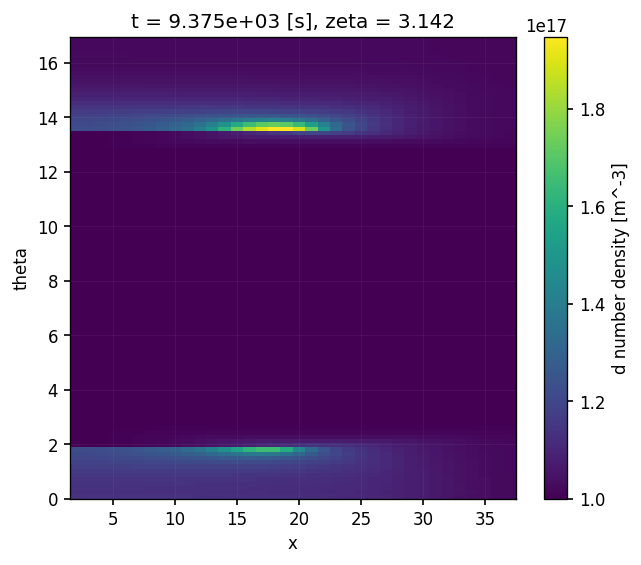

In [21]:
fig, ax = plt.subplots()
ds = cs["test-new1"].ds.isel(t=10, x = slice(2,-2))

ds["Nd"].plot(ax = ax, x = "x", y = "theta")

/tmp/ipykernel_3057196/3222652463.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))


(0.15, 0.65)

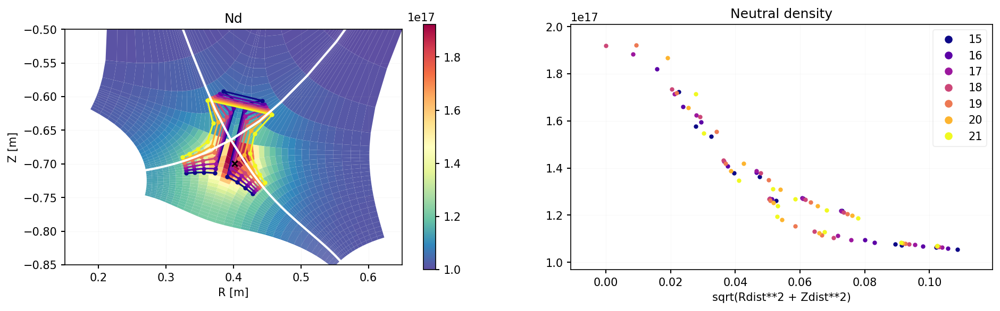

In [18]:
ds = cs["test5"].ds.isel(t=10)
m = ds.metadata

fig, axes = plt.subplots(1,2, figsize = (15,4), dpi = 150)

# indices = range(15,23)
indices = [15,16,17, 18, 19,20,21]
colors = mpl.cm.get_cmap("plasma", len(indices))(range(len(indices)))

for i, radial_idx in enumerate(indices):
    sl = ds.isel(theta = 
                 np.r_[slice(11-3,11+3), 
                       slice(87-3,87+3)
                       ],
                 x = radial_idx)
    # sl = ds.isel(theta = slice(86-3,86+8), x = radial_idx)
    p1 = ds.isel(x = 18, theta=86)
    
    rdist = sl["R"] - p1["R"]
    zdist = sl["Z"] - p1["Z"]
    dist = np.sqrt(rdist**2 + zdist**2)
    
    # dist = np.cumsum(sl["dr"])
    # dist -= dist[m["ixseps1"]-2]

    axes[1].plot(dist, sl["Nd"], marker = "o", ms = 3, label = radial_idx, color = colors[i], lw = 0)
    axes[0].plot(sl["R"], sl["Z"], marker = "o", ms = 3,  color = colors[i])
    

axes[0].scatter(p1["R"], p1["Z"], marker = "x", c = "k", s = 25, zorder = 100)
axes[1].legend()
axes[1].set_yscale("linear")
axes[1].set_xlabel("sqrt(Rdist**2 + Zdist**2)")
# axes[1].set_ylabel("Temp [eV]")
axes[1].set_title("Neutral density")

ds["Nd"].hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", antialias = True)


axes[0].set_ylim(-0.85, -0.5)
axes[0].set_xlim(0.15,0.65)

In [33]:
print(point["R"], point["Z"])

<xarray.DataArray 'R' ()>
array(0.40158318)
Coordinates: (12/24)
    dx                       float64 dask.array<chunksize=(), meta=np.ndarray>
    dy                       float64 dask.array<chunksize=(), meta=np.ndarray>
    dz                       float64 dask.array<chunksize=(), meta=np.ndarray>
    zShift                   float64 dask.array<chunksize=(), meta=np.ndarray>
    t                        float64 5.4e+03
    psi_poloidal             float64 -0.01916
    ...                       ...
    Zxy_upper_left_corners   float64 -0.7092
    Zxy_upper_right_corners  float64 -0.704
    x                        int64 18
    theta                    float64 13.59
    zeta                     float64 3.142
    theta_idx                int64 86
Attributes:
    metadata:  {'BOUT_VERSION': 5.01, 'Bnorm': 1.0, 'Cs0': 43769.47178814495,...
    options:   ##### Test case to show neutral puff travelling through domain...
    regions:   {'lower_inner_PFR': <xbout.region.Region>\n\tname\tlow

## Temperature

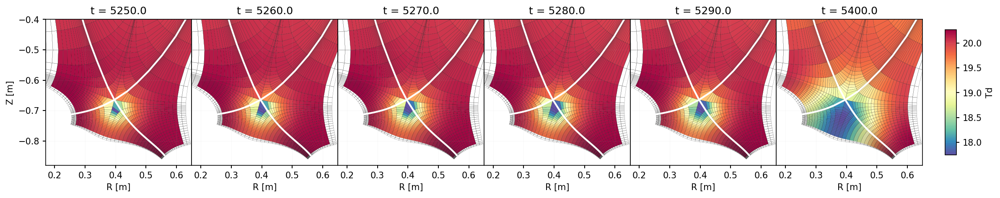

In [20]:
plot_2d_timeslices(cs["test5"].ds, "Td", 
                   logscale = False,
                   common_scale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

# Test 4
- Move location to just next to X-point (loc 2)
- Puff 1e21 @ 20eV for 250t
- Continue without puff at 5t timesteps

In [12]:
%matplotlib inline
plt.close("all")
tinds = [5,6,8,10,12,-1]

## Density

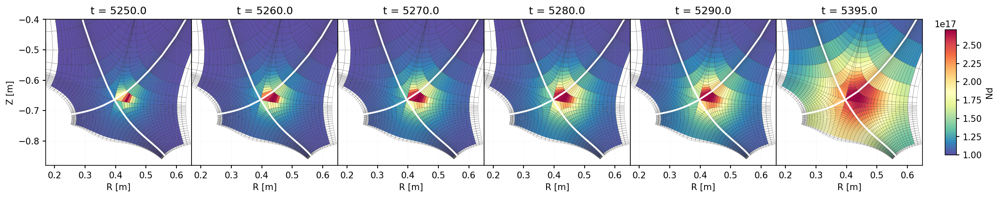

In [21]:
plot_2d_timeslices(cs["test4"].ds, "Nd", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   common_scale = False,
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

## Temperature

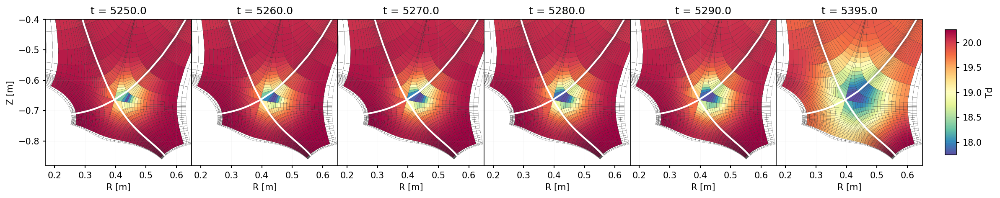

In [22]:
plot_2d_timeslices(cs["test4"].ds, "Td", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   common_scale = False,
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

# Test 3
- Puff 1e21 @ 20eV for 200t
- Continue without puff at 5t timesteps

In [19]:
cs.keys()

dict_keys(['test2'])

In [15]:
%matplotlib inline
plt.close("all")
tinds = [5,6,7,8,9,-1]

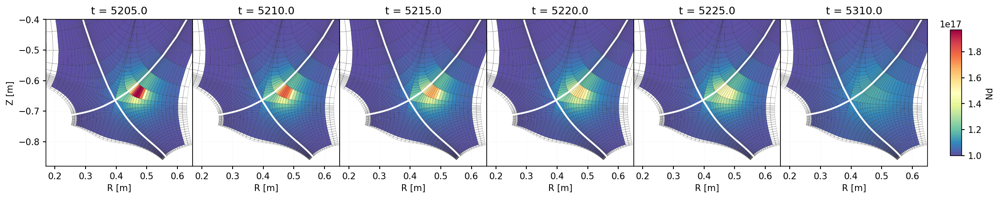

In [6]:
plot_2d_timeslices(cs["test3"].ds, "Nd", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

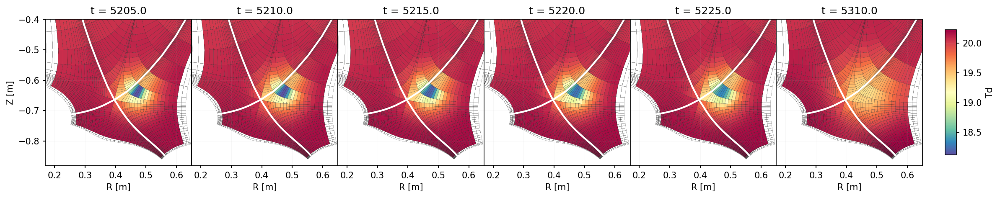

In [16]:
plot_2d_timeslices(cs["test3"].ds, "Td", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

# Test 2
- Puff 1e21 @ 20eV for 100t
- Continue at 5t timesteps

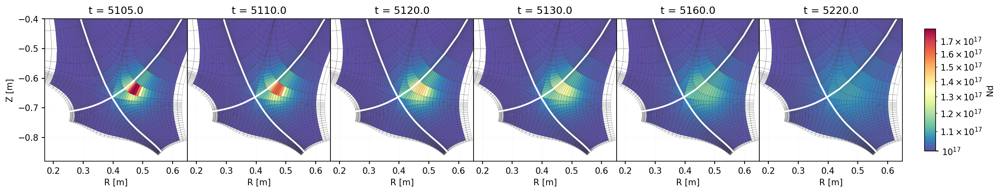

In [8]:
plot_2d_timeslices(cs["test2"].ds, "Nd", 
                   logscale = True,
                   tinds=[3,4,6,8,14,26], 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

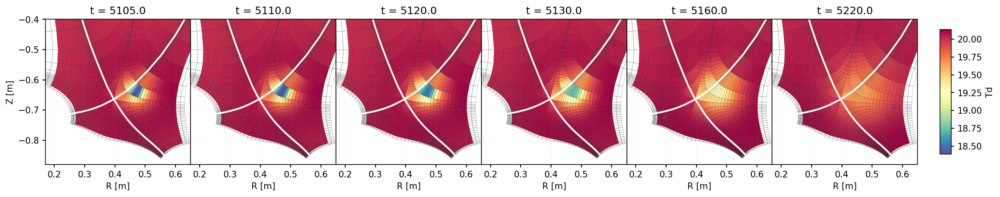

In [7]:
plot_2d_timeslices(cs["test2"].ds, "Td", 
                   logscale = False,
                   tinds=[3,4,6,8,14,26], 
                   vmin = None, vmax = None, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

# Test 1
- Puff at 1e20, 3eV (I made a mistake and the heat is 3eV * 1e21)

In [ ]:
tinds = [3,4,5,6,7]

## Density

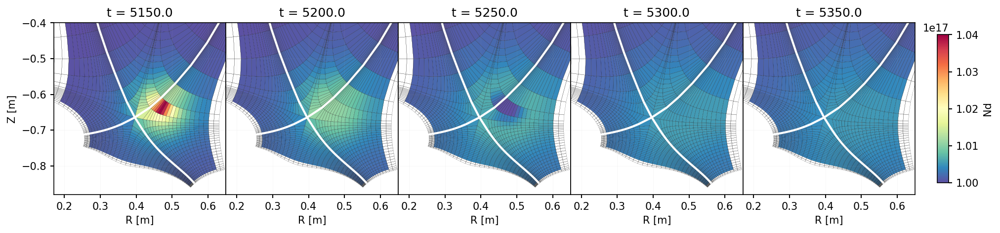

In [62]:
plot_2d_timeslices(cs["test1"].ds, "Nd", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = 1e17, vmax = 1.04e17, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

## Pressure

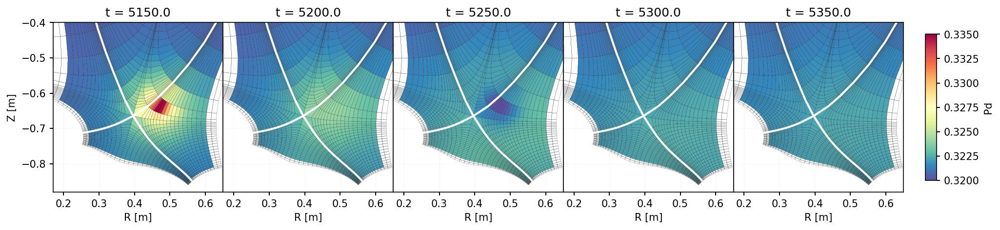

In [67]:
plot_2d_timeslices(cs["test1"].ds, "Pd", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = 0.320, vmax = 0.335, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

## Temperature

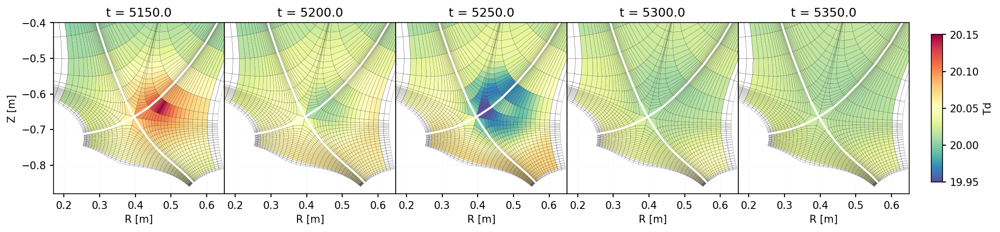

In [65]:
plot_2d_timeslices(cs["test1"].ds, "Td", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = 19.95, vmax = 20.15, 
                   xlim = (0.17, 0.65),
                   ylim = (-0.88, -0.4))

## Pressure in mesh seam

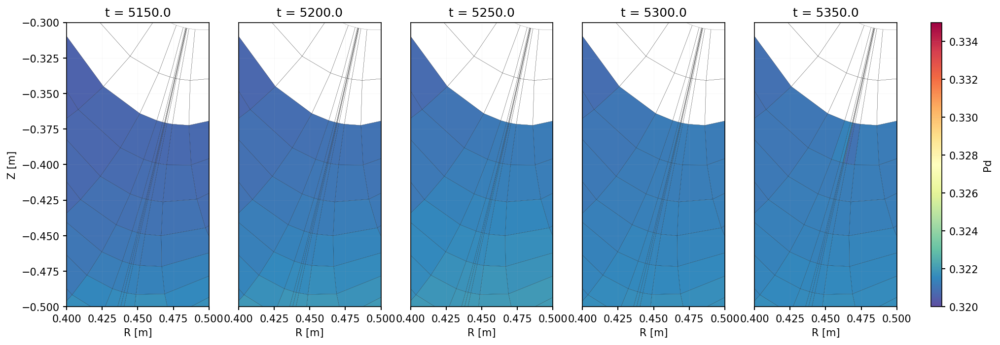

In [74]:
plot_2d_timeslices(cs["test1"].ds, "Pd", 
                   logscale = False,
                   tinds=tinds, 
                   vmin = 0.320, vmax = 0.335, 
                   xlim = (0.4, 0.5),
                   ylim = (-0.5, -0.3))

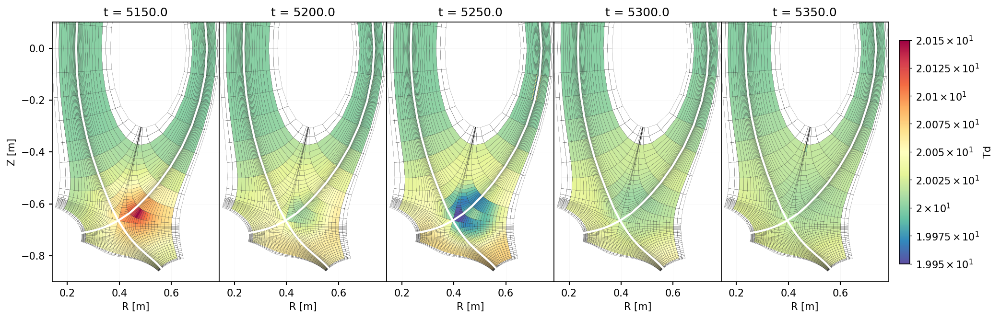

In [37]:
ds = cs["test1"].ds

tinds = [3,4,5,6,7]

def plot_2d_timeslices(ds, param, tinds, vmin = None, vmax = None, cmap = "Spectral_r", logscale = True, **kwargs):
    nfigs = len(tinds)
    fig, axes = plt.subplots(1,nfigs, figsize = (3*nfigs,5), dpi = 150, sharey = True)
    logscale = True
    cmap = "Spectral_r"
    param = "Td"
    vmin = 19.95
    vmax = 20.15
    norm = create_norm(logscale, None, vmin, vmax)
    style = dict(cmap = cmap, antialias = True, linewidth = 0.1, linecolor = "k",
                add_colorbar = False,
                vmin = 19.95, vmax = 20.15)
    style.update(**kwargs)
    
    # Get min and max
    mins, maxes = [], []
    for i, tind in enumerate(tinds):
        mins.append(np.nanmin(ds.isel(t=tind)[param].values))
        maxes.append(np.nanmax(ds.isel(t=tind)[param].values))
    
    if vmin is None: vmin = min(mins)
    if vmax is None: vmin = max(maxes)
    
    
    for i, tind in enumerate(tinds):
        ds.isel(t=tind)[param].hermesm.clean_guards().bout.polygon(ax = axes[i],  **style)
        axes[i].set_title(f"t = {ds.isel(t=tind)['t'].values}")
        
        if i != 0:
            axes[i].set_ylabel("")
            axes[i].tick_params(axis="y", which="both", left=False,labelleft=False)
        axes[i].set_ylim(-0.9, 0.1)
        
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    cax = fig.add_axes([
        axes[-1].get_position().x1+0.01,
        axes[-1].get_position().y0,0.01,
        axes[-1].get_position().height])

    cbar = plt.colorbar(mappable = sm, cax=cax, label = param) # Similar to fig.colorbar(im, cax = cax)
        
    fig.subplots_adjust(wspace = 0)

plot_2d_timeslices(cs["test1"].ds, "Td", tinds, vmin = None, vmax = None)

KeyError: 'Nd_src'

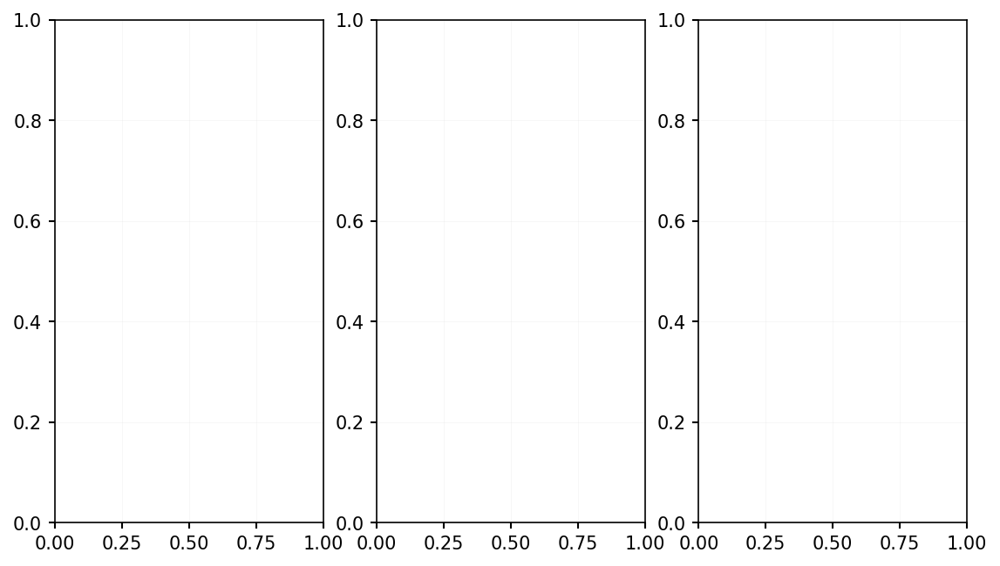

In [70]:
ds = cs["test1"].ds.isel(t=0)

nfigs = 3
fig, axes = plt.subplots(1,nfigs, figsize = (3*nfigs,5), dpi = 150)

style = dict(cmap = "Spectral_r", antialias = True, linewidth = 0.1, linecolor = "k")

ds["Nd_src"].hermesm.clean_guards().bout.polygon(ax = axes[0], **style)
ds["Pd"].hermesm.clean_guards().bout.polygon(ax = axes[1], **style)
ds["Td"].hermesm.clean_guards().bout.polygon(ax = axes[2], **style)
# ds["NVd"].hermesm.clean_guards().bout.polygon(ax = axes[3], **style)

fig.tight_layout()

/ssd_scratch/scripts/sdtools/hermes3/plotting.py:797: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axes[i].set_yscale(scale)
/ssd_scratch/scripts/sdtools/hermes3/plotting.py:797: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axes[i].set_yscale(scale)
/ssd_scratch/scripts/sdtools/hermes3/plotting.py:797: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axes[i].set_yscale(scale)


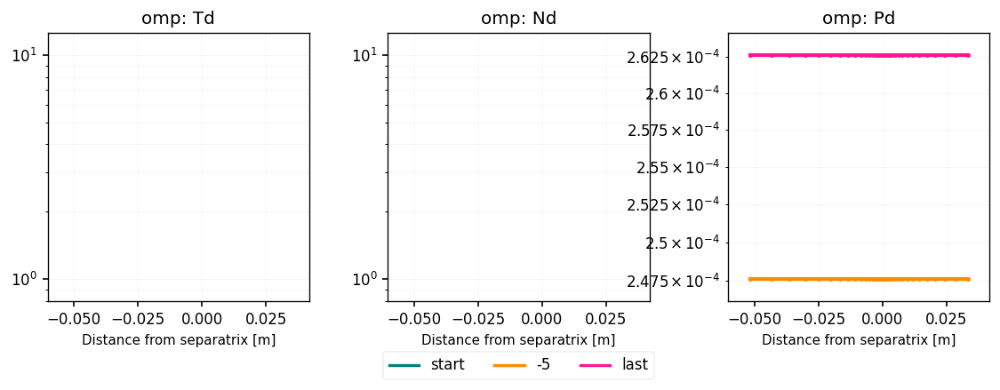

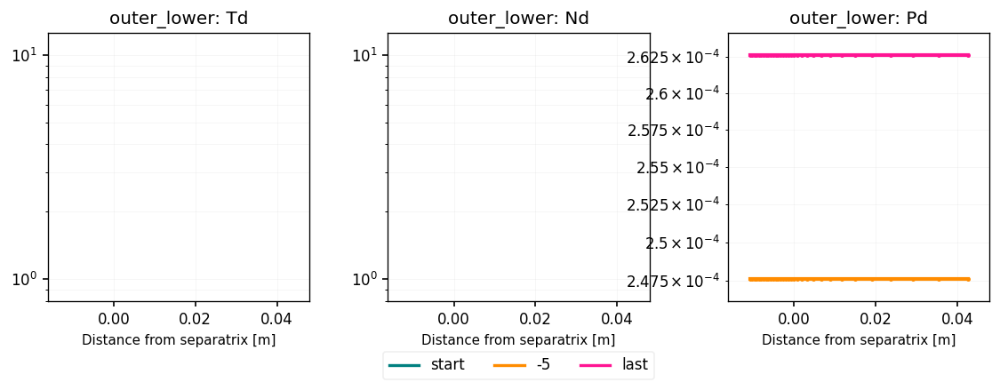

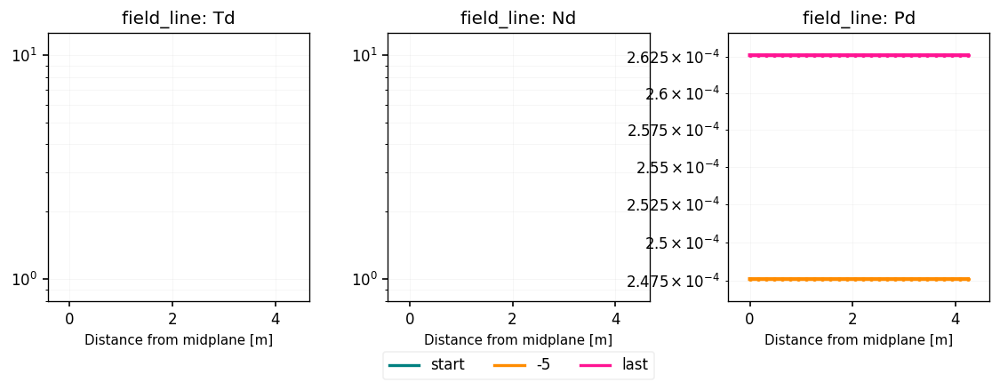

In [7]:
case = "base"
lineplot(
    {
        "start":cs[case].ds.isel(t=0),
        "-5":cs[case].ds.isel(t=-5),
        "last":cs[case].ds.isel(t=-1),

    },
    clean_guards = True,
    params = ["Td", "Nd", "Pd"],
    regions = ["omp", "outer_lower", "field_line"],
)

# Grid prep

In [12]:
%matplotlib widget

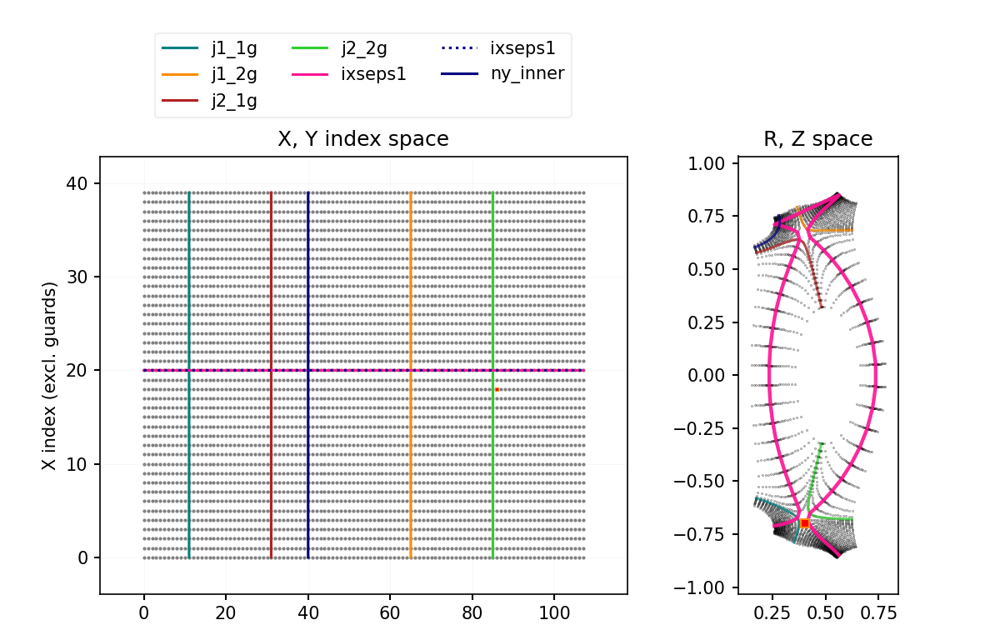

In [13]:
plt.close("all")
ds = cs["test3"].ds
plot_selection(ds, ds.isel(x = 18, theta = 86), dpi = 150)

Total flow: 1e+21 [s-1]
Total flow per volume: 1.74e+24 [s-1 m-3]
Total heat source: 3.20e+03 [W]
Total heat source per volume: 5.56e+06 [W m-3]

>>> Field Nd_src already exists in /ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc, it will be overwritten
-> Wrote field Nd_src to /ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc
>>> Field Pd_src already exists in /ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc, it will be overwritten
-> Wrote field Pd_src to /ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc
Mesh file /ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc closed


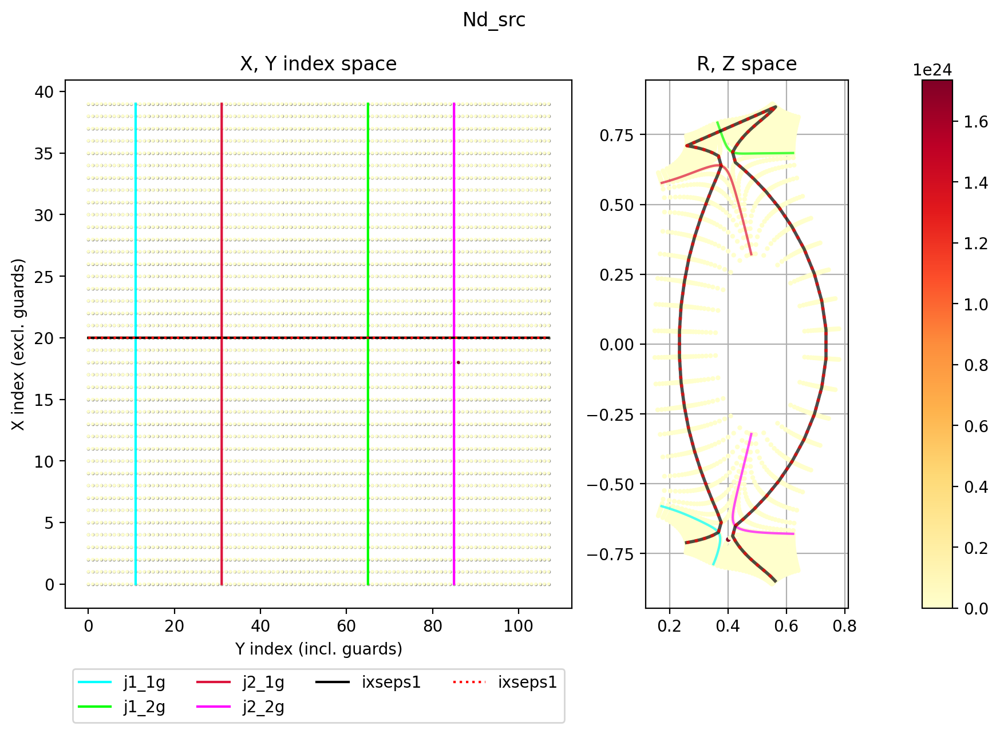

In [15]:
plt.close("all")
mesh = Mesh(r"/ssd_scratch/hcases/g3b2x4-1e21_20eV_loc3.nc")
self = mesh


selection =  (18,86)
            
# puff_region = mesh.slices("symmetric_puff")(width=3, center_half_gap=1)
puff_region = selection

mesh.mesh["dv"] = mesh.mesh["dy"] * mesh.mesh["dx"] * mesh.mesh["J"] * 2*np.pi
volume = mesh.mesh["dv"][puff_region]

total_flow = 1e21   # atoms per second

total_flow_per_volume = total_flow * (volume/volume.sum()) / volume  # first find how much per cell, then per volume
print(f"Total flow: {total_flow} [s-1]")
print(f"Total flow per volume: {total_flow_per_volume.sum():.2e} [s-1 m-3]")

heat_source = total_flow * 20 * constants("q_e")  #  3eV per particle (assume dissociated molecules)
heat_source_per_volume = heat_source * (volume/volume.sum()) / volume 
print(f"Total heat source: {heat_source:.2e} [W]")
print(f"Total heat source per volume: {heat_source_per_volume.sum():.2e} [W m-3]")


Pd_src = Field("Pd_src", mesh)
Nd_src = Field("Nd_src", mesh)

print()

Nd_src.data[puff_region] = total_flow_per_volume
Pd_src.data[puff_region] = heat_source_per_volume
mesh.write_field(Nd_src)
mesh.write_field(Pd_src)

Nd_src.plot(dpi = 200)

try:
    mesh.close()
    del mesh
except:
    pass

# Unrelated

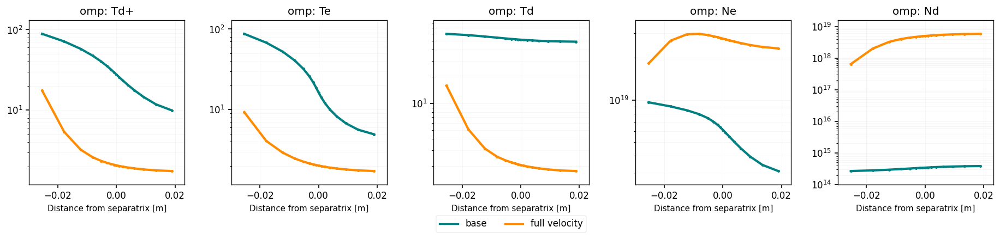

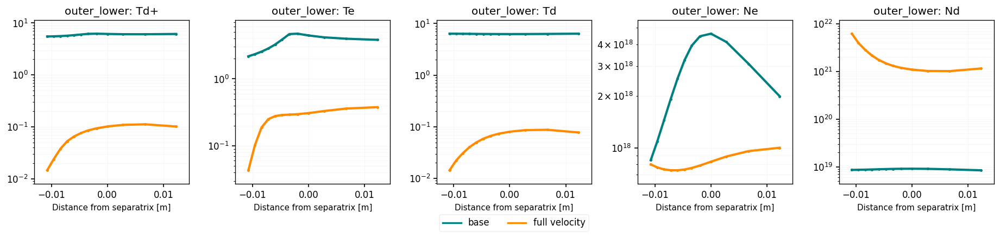

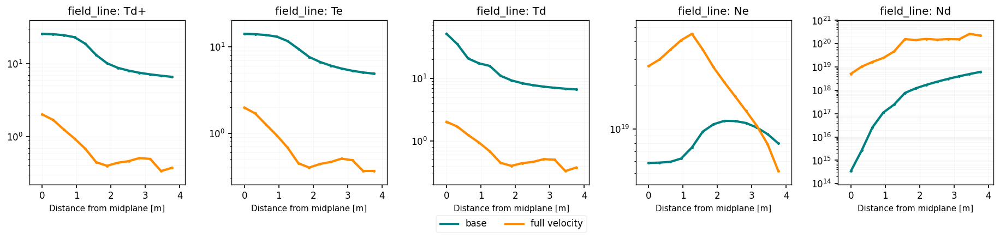

In [6]:
lineplot(
    {
        "base":casestore["base"].ds.isel(t=-1),
        "full velocity":casestore["test"].ds.isel(t=-1),
    },
    clean_guards = True,
    params = ["Td+", "Te", "Td", "Ne", "Nd"],
    regions = ["omp", "outer_lower", "field_line"],
)

In [ ]:
ds.data_vars

In [11]:
ds["Vd_z"].values

array([[9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36],
       [9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36],
       [9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36],
       ...,
       [9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36],
       [9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36],
       [9.96920997e+36, 9.96920997e+36, 9.96920997e+36, ...,
        9.96920997e+36, 9.96920997e+36, 9.96920997e+36]])

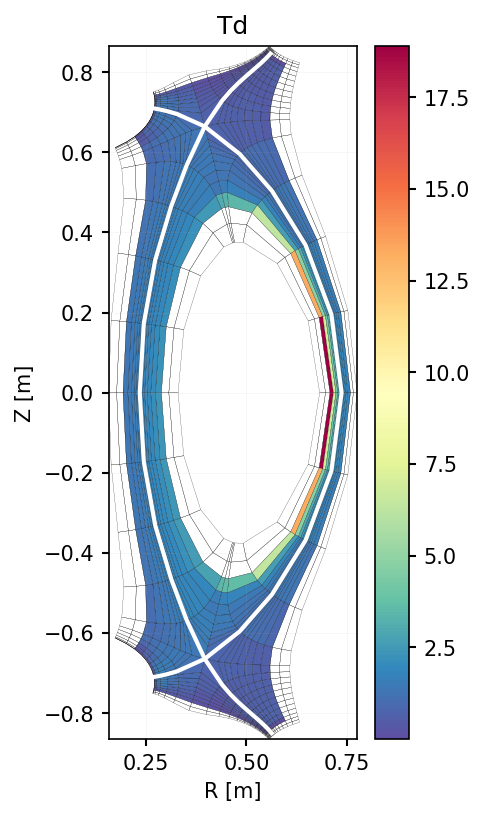

In [27]:
ds = casestore["test"].ds.isel(t=-1)

fig, ax = plt.subplots(figsize = (3,6), dpi = 150)
ds["Td"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", antialias = True, linewidth = 0.1, linecolor = "k")


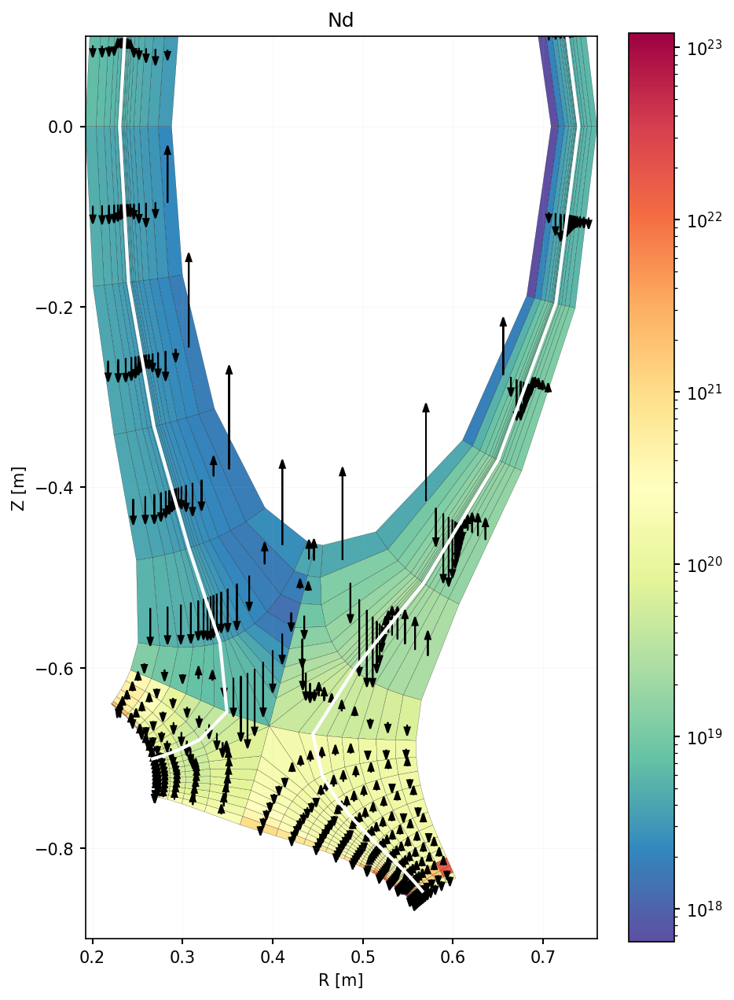

In [14]:
ds = casestore["test"].ds.isel(t=-1, x = slice(2,-2))

fig, ax = plt.subplots(figsize = (7,10), dpi = 150)
ds["Nd"].bout.polygon(ax = ax, cmap = "Spectral_r", antialias = True, linewidth = 0.1, linecolor = "k", logscale = True)

scale = 1
X, Y = ds["R"].values.flatten(), ds["Z"].values.flatten()
Vx, Vy = ds["Vd_x"].values.flatten(), ds["Vd_y"].values.flatten()
ax.set_ylim(-0.9, 0.1)
scale = 2e-3
for i in range(len(X)):
    ax.arrow(X[i], Y[i], Vx[i]*scale, Vy[i]*scale, width = scale * 0.00001, head_width = scale * 3, linewidth = 1, edgecolor = "k", facecolor = "k", capstyle = "butt")

(-0.9, 0.1)

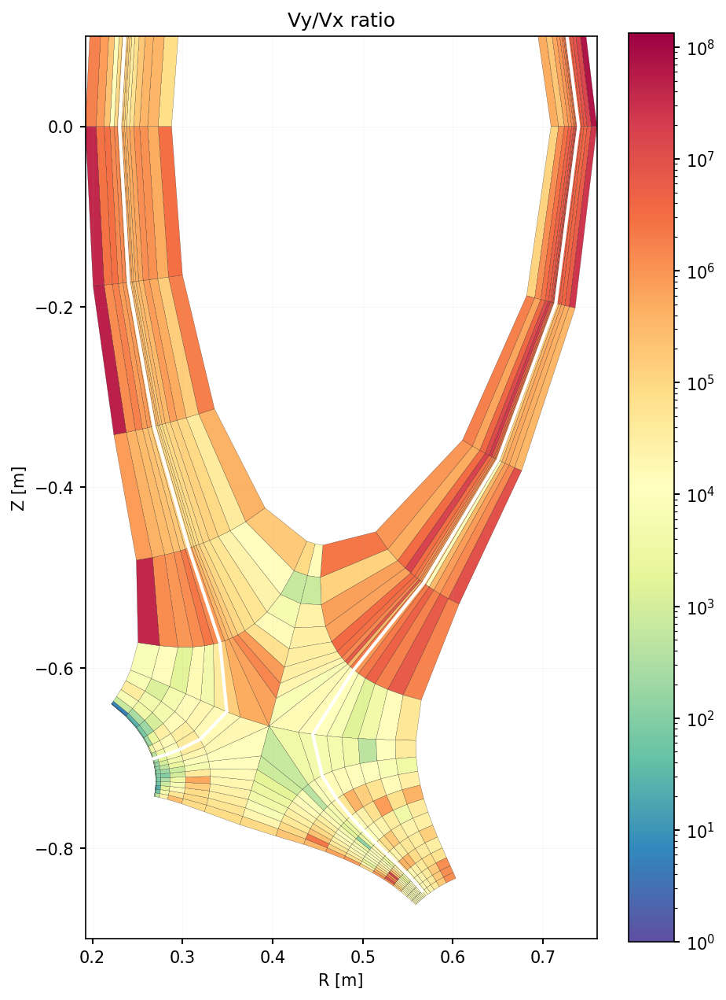

In [22]:
ds = casestore["test"].ds.isel(t=-1, x = slice(2,-2))

fig, ax = plt.subplots(figsize = (7,10), dpi = 150)
(abs(ds["Vd_y"])/abs(ds["Vd_x"])).bout.polygon(ax = ax, cmap = "Spectral_r", antialias = True, linewidth = 0.1, linecolor = "k", logscale = True, vmin = 1, vmax = None)
ax.set_title("Vy/Vx ratio")
scale = 1
# X, Y = ds["R"].values.flatten(), ds["Z"].values.flatten()
# Vx, Vy = ds["Vd_x"].values.flatten(), ds["Vd_y"].values.flatten()
ax.set_ylim(-0.9, 0.1)
# scale = 2e-3
# for i in range(len(X)):
#     ax.arrow(X[i], Y[i], Vx[i]*scale, Vy[i]*scale, width = scale * 0.00001, head_width = scale * 3, linewidth = 1, edgecolor = "k", facecolor = "k", capstyle = "butt")

(0.35, 0.65)

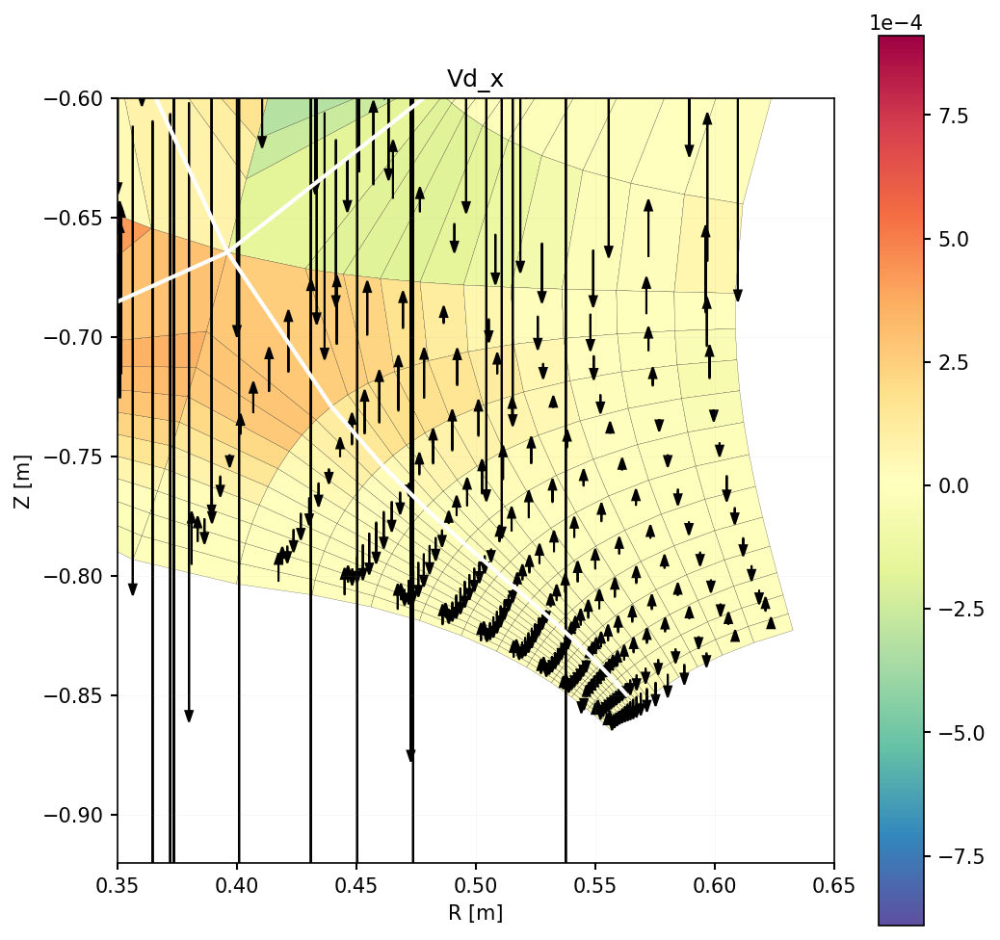

In [23]:
ds = casestore["test"].ds.isel(t=-1)

fig, ax = plt.subplots(figsize = (8,8), dpi = 150)
ds["Vd_x"].bout.polygon(ax = ax, cmap = "Spectral_r", antialias = True, linewidth = 0.1, linecolor = "k")

scale = 1
X, Y = ds["R"].values.flatten(), ds["Z"].values.flatten()
Vx, Vy = ds["Vd_x"].values.flatten(), ds["Vd_y"].values.flatten()
# Vy = np.zeros_like(Vx)
scale = 10e-3
for i in range(len(X)):
    ax.arrow(X[i], Y[i], Vx[i]*scale, Vy[i]*scale, width = 1e-3 * 0.00001, head_width = 3e-3, linewidth = 1, edgecolor = "k", facecolor = "k", capstyle = "butt")
    
ax.set_ylim(-0.92, -0.6)
ax.set_xlim(0.35,0.65)